In [1]:
include("State_Space_Model.jl")
using .state_space_model

include("Kalman.jl")
using .kalman

include("MCMC.jl")
using .MCMC

using Random
using LinearAlgebra
using Statistics
using Distributions
using ProgressMeter
using SpecialFunctions
using Plots
using ProgressMeter


In [2]:
# Parameters in θ
θ_elements = ["ρ", "λ_c", "σ²_ε, y", "σ²_ξ, y", "σ²_κ, y"]
n_params = length(θ_elements)

# Create the support matrix
support = repeat([0 3], n_params, 1)
support[1, 2] = 1
println("Support:", support)

# Create the prior distributions
prior_distributions = fill("uniform", n_params)
println("Prior distributions: ", prior_distributions)

# Create the prior hyperparameters matrix
prior_hyperparameters = repeat([0 3], n_params, 1)
prior_hyperparameters[1, 2] = 1
println("Prior hyperparameters:", prior_hyperparameters)

# Combine into a named tuple
prior_info = (
    support = support,
    distributions = prior_distributions,
    parameters = prior_hyperparameters,
)


# True parameters
ρ = 0.6
λ_c = 1.5
σ²_ε_y = 0.5
σ²_ξ_y = 0.7
σ²_κ_y = 0.3

θ_true = [ρ, λ_c, σ²_ε_y, σ²_ξ_y, σ²_κ_y]

# cycle_order
cycle_order = 2


#States in α
α_elements = [
    "u_t^y", 
    "β_t^y", 
    "ψ_{2,t}^y", 
    "ψ_{2,t}^{y*}", 
    "ψ_{1,t}^y", 
    "ψ_{1,t}^{y*}", 
]

Support:[0 1; 0 3; 0 3; 0 3; 0 3]
Prior distributions: ["uniform", "uniform", "uniform", "uniform", "uniform"]
Prior hyperparameters:[0 1; 0 3; 0 3; 0 3; 0 3]


6-element Vector{String}:
 "u_t^y"
 "β_t^y"
 "ψ_{2,t}^y"
 "ψ_{2,t}^{y*}"
 "ψ_{1,t}^y"
 "ψ_{1,t}^{y*}"

In [3]:
Z,H,T,R,Q,P_diffuse = state_space(θ_true, cycle_order)
println("Z = ", Z)
println("H = ", H)
println("T = ", T)
println("R = ", R)
println("Q = ", Q)
println("P_diffuse = ", P_diffuse)

# Print shapes
println("Z shape: ", size(Z))
println("H shape: ", size(H))
println("T shape: ", size(T))
println("R shape: ", size(R))
println("Q shape: ", size(Q))
println("P_diffuse shape: ", size(P_diffuse))

Z = [1.0 0.0 1.0 0.0 0.0 0.0]
H = [0.5]
T = [1.0 1.0 0.0 0.0 0.0 0.0; 0.0 1.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.042442321000621744 0.5984969919624327 1.0 0.0; 0.0 0.0 -0.5984969919624327 0.042442321000621744 0.0 1.0; 0.0 0.0 0.0 0.0 0.042442321000621744 0.5984969919624327; 0.0 0.0 0.0 0.0 -0.5984969919624327 0.042442321000621744]
R = [0.0 0.0 0.0; 1.0 0.0 0.0; 0.0 0.0 0.0; 0.0 0.0 0.0; 0.0 1.0 0.0; 0.0 0.0 1.0]
Q = [0.7 0.0 0.0; 0.0 0.3 0.0; 0.0 0.0 0.3]
P_diffuse = [1.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0]
Z shape: (1, 6)
H shape: (1,)
T shape: (6, 6)
R shape: (6, 3)
Q shape: (3, 3)
P_diffuse shape: (6, 6)


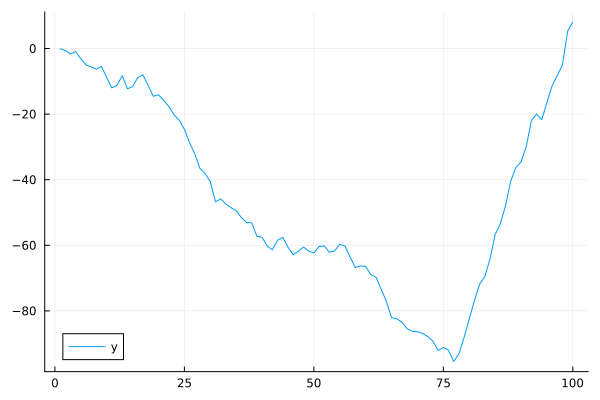

shape of obs = (100, 1)
shape of α = (100, 6)


In [4]:
n_obs = 100

#simulate data
obs, α = simulate_data(θ_true, cycle_order, n_obs)

# shape of obs
println("shape of obs = ", size(obs))
# shape of α
println("shape of α = ", size(α))

y = obs[:,1]


# plot data
plot(y, label="y")
display(plot!())



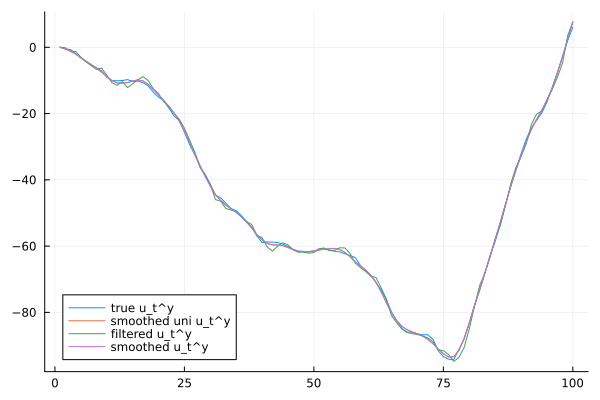

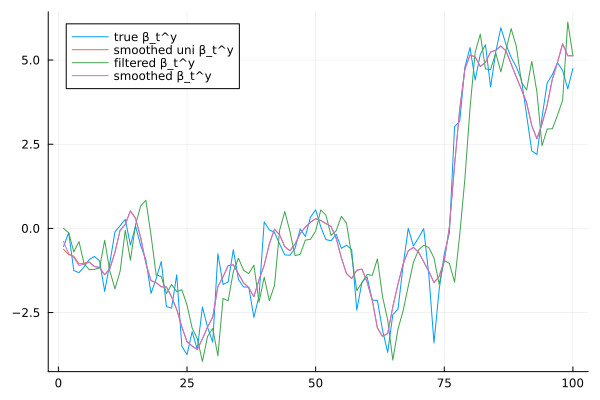

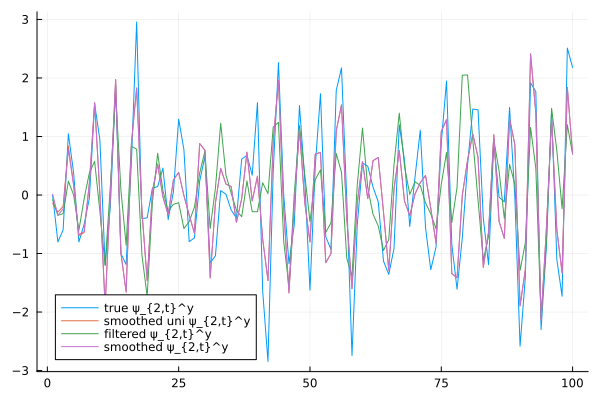

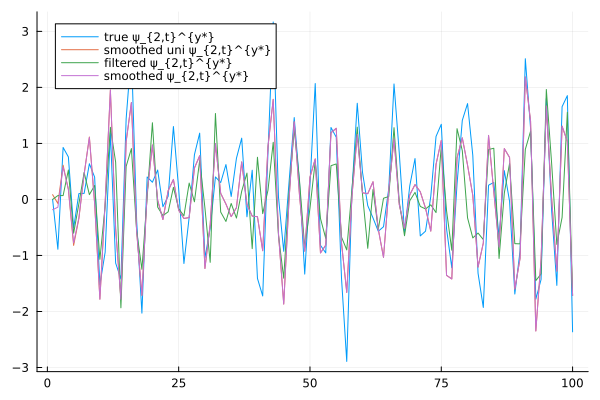

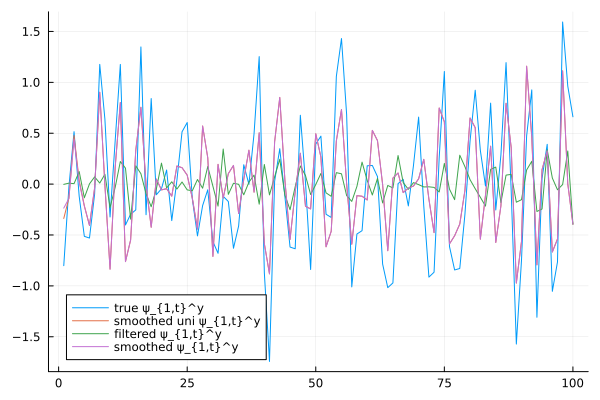

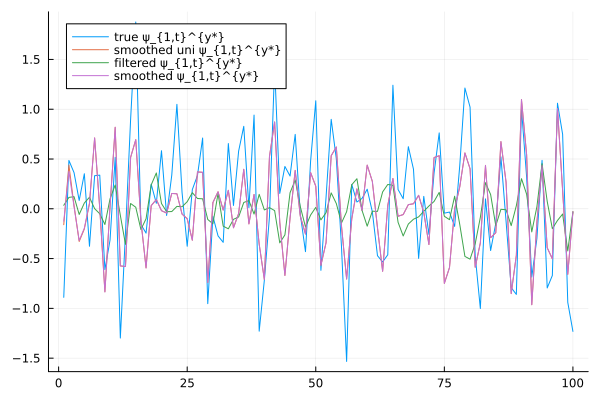

In [5]:
#Kalman filter 
α0 = zeros(size(T, 1))
P0 = Matrix(I, size(T, 1), size(T, 1))  # large initial uncertainty

LogL_diff, α_diff, P_diff = diffuse_kalman_filter(obs, θ_true, α0, P0, cycle_order, true, false)

LogL, α_f, P_f, α_p, P_p = kalman_filter(obs, θ_true, α0, P0, cycle_order)

α_s, P_s = kalman_smoother(θ_true, cycle_order, α_f, P_f, α_p, P_p)





for i in 1:size(α,2)
    plot(α[:,i], label="true $(α_elements[i])")
    plot!(α_diff[:,i], label="smoothed uni $(α_elements[i])")
    plot!(α_f[:,i], label="filtered $(α_elements[i])")
    plot!(α_s[:,i], label="smoothed $(α_elements[i])")
    display(plot!())
end






## MCMC

In [6]:
burn = 5000

θ_init, Σ, acceptance_rate = initialize_mcmc(y, prior_info, α0, P0, cycle_order;
                                 iter=40000, burn=burn, ω=0.01)


Initialization Phase 100%|███████████████████████████████| Time: 0:00:10


Initialization Acceptance Rate: 67.02749999999999 %


([0.48109741494685576 1.5162983556741458 … 1.351485211008138 1.54293316609502; 0.524137642630022 1.4131167448927782 … 1.347841182649928 1.5038553423606373; … ; 0.49698162211669267 1.4334136062597524 … 0.6725928487301968 0.5114603461920149; 0.519376106171173 1.4086892791796457 … 0.6643608470411737 0.5186214516150554], [0.21107179881863394 0.06538974486531167 … 0.045741408063891084 -0.3940764815298641; 0.06538974486531167 0.06896143445069196 … 0.035050422323119 -0.1620008873134114; … ; 0.045741408063891084 0.035050422323119 … 0.22722656289989843 -0.13591918734869973; -0.3940764815298641 -0.1620008873134114 … -0.13591918734869973 0.9197300146808303], 0.670275)

Initial chain shape: (40000, 5)
ρ = 0.5360445156172879
λ_c = 1.4438780836443394
σ²_ε, y = 0.26671738629402547
σ²_ξ, y = 0.9548016764274067
σ²_κ, y = 0.5077309020005774


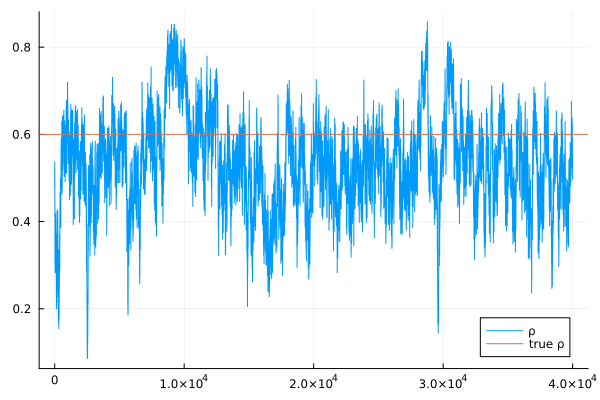

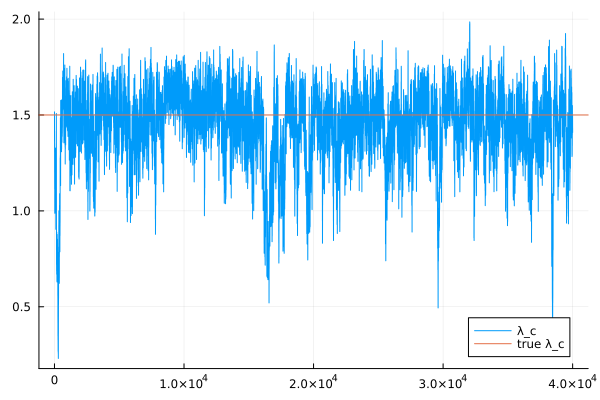

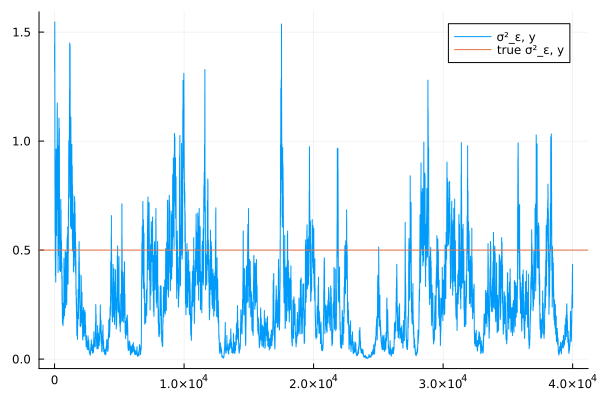

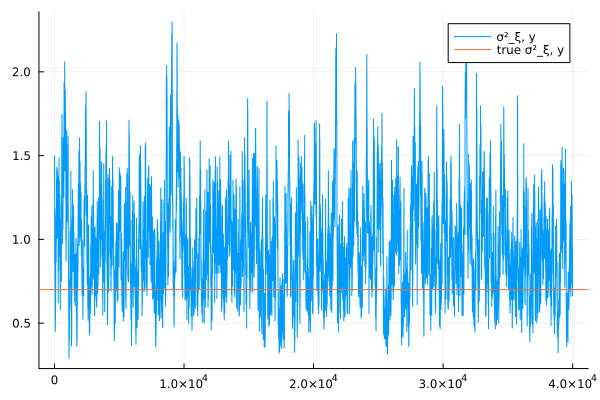

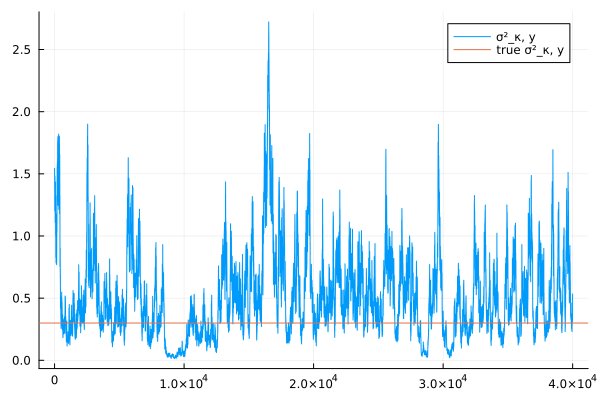

In [7]:
println("Initial chain shape: ", size(θ_init))
# for each parameter print mean
for i in 1:size(θ_init, 2)
    println("$(θ_elements[i]) = $(mean(θ_init[burn+1:end,i]))")
end


#Print trace plot and add true value
for i in 1:size(θ_init, 2)
    plot(θ_init[:,i], label="$(θ_elements[i])")
    hline!([θ_true[i]], label="true $(θ_elements[i])")
    display(plot!())
end

In [8]:
θ_rec, α_draws, acceptance_rate =  mcmc_recursion(y,prior_info,α0, P0,cycle_order;
    iter = 40000,
    burn = 5000,
    θ_init = θ_init[end,:],
    Σ = Σ,
    ω = 0.1)


Recursion Phase 100%|████████████████████████████████████| Time: 0:00:40


Recursion Acceptance Rate: 26.51 %


([0.519376106171173 1.4086892791796455 … 0.6643608470411737 0.5186214516150552; 0.519376106171173 1.4086892791796455 … 0.6643608470411737 0.5186214516150552; … ; 0.5821733207628781 1.5505951814466234 … 0.9438070570108835 0.3022466299168966; 0.5821733207628781 1.5505951814466234 … 0.9438070570108835 0.3022466299168966], [-1.6080060227621817 -1.137006490505644 … 1.8349874387114795 6.5851539755995745; -0.13556533640543686 -0.828558206435729 … 3.409401945141042 7.267564892080372; … ; 1.2363263937546005 -0.05539052537265188 … 2.5733758065557595 8.793323816030124; 0.062047418042968316 -0.36117474507845393 … 3.2393421570543524 6.233802339882459;;; 0.47099953225653757 -0.06483234957522804 … 4.750166536888097 4.736187432690695; -0.6929928700302921 -0.4847193586343831 … 3.858162946939353 4.688980902502042; … ; -1.2917169191272524 -1.6184574389016646 … 6.219948009474386 7.44442799612953; -0.42322216312142225 -0.4299036168336702 … 2.9944601828281527 1.0805596899244954;;; 1.510906493554316 0.547473

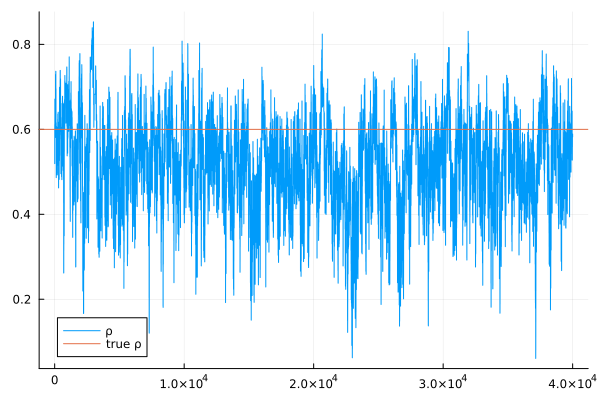

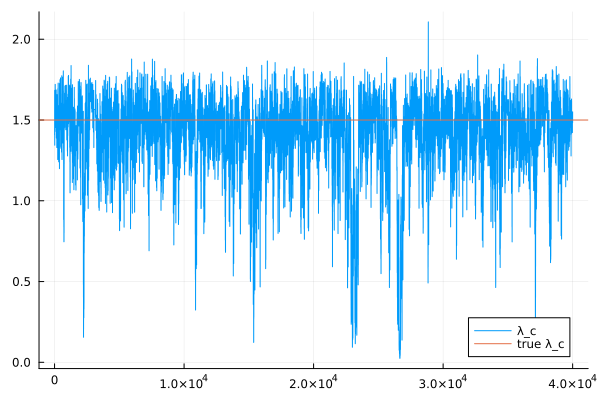

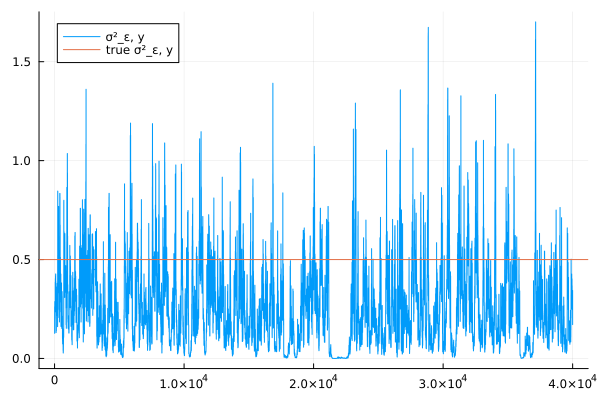

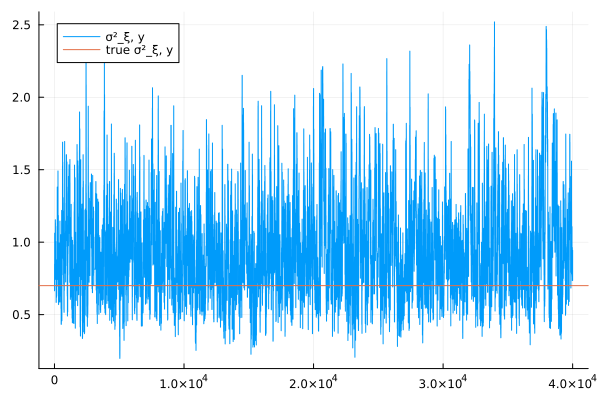

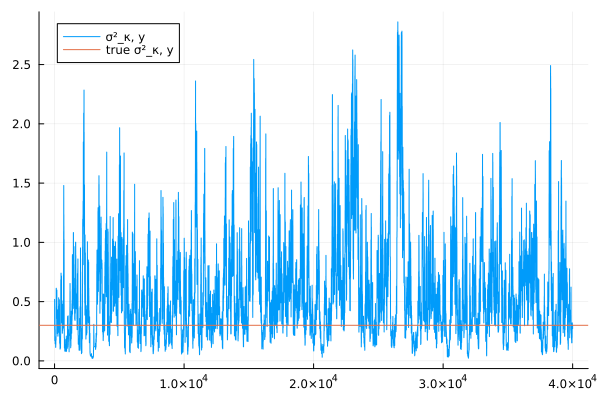

Recovered chain shape: (40000, 5)
ρ = 0.5133858349022212
λ_c = 1.39610391780313
σ²_ε, y = 0.24980803534063603
σ²_ξ, y = 0.9365761833678565
σ²_κ, y = 0.5946500001578456


In [9]:
println("Recovered chain shape: ", size(θ_rec))
# for each parameter print mean
for i in 1:size(θ_rec, 2)
    println("$(θ_elements[i]) = $(mean(θ_rec[burn+1:end,i]))")
end

#Print trace plot and add true value
for i in 1:size(θ_init, 2)
    plot(θ_rec[:,i], label="$(θ_elements[i])")
    hline!([θ_true[i]], label="true $(θ_elements[i])")
    display(plot!())
end



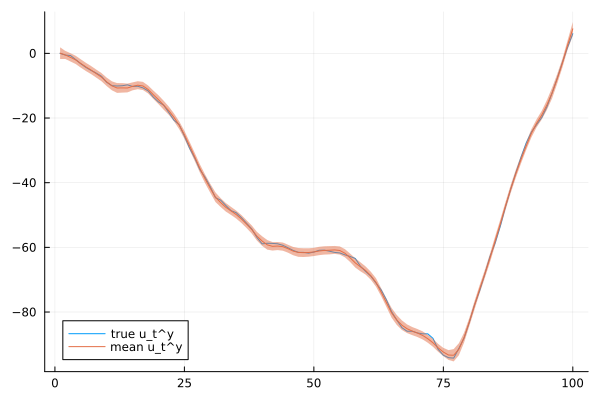

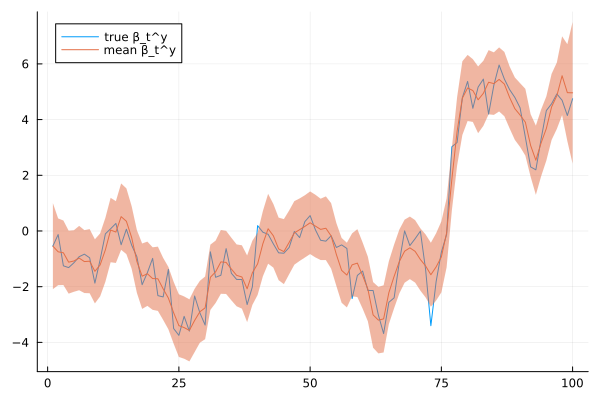

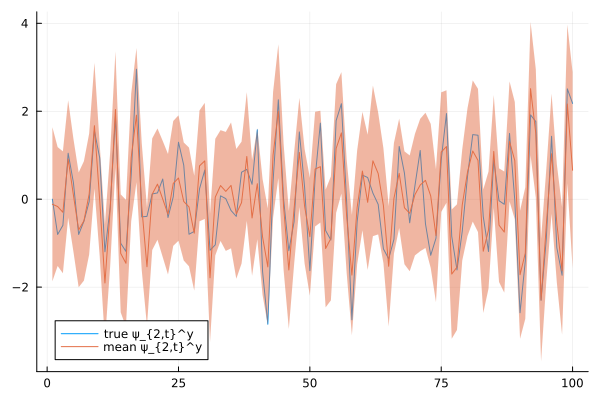

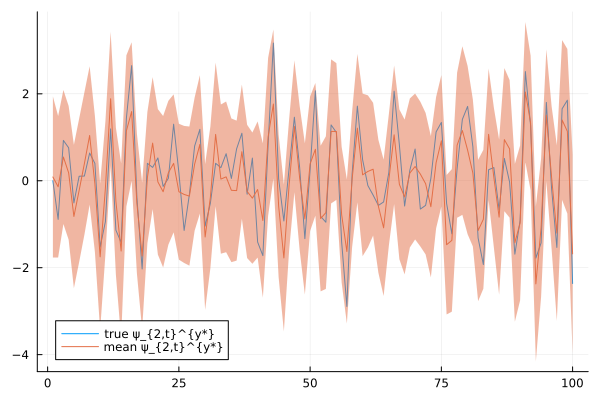

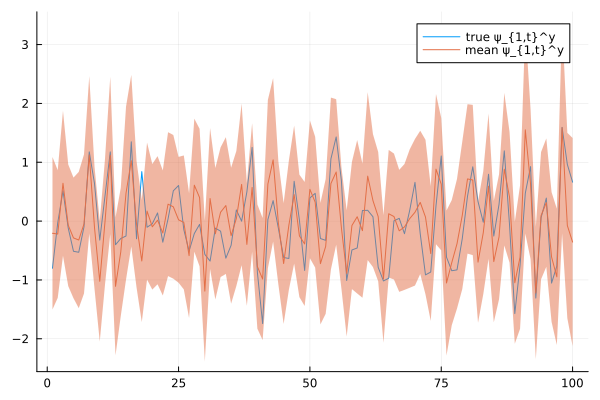

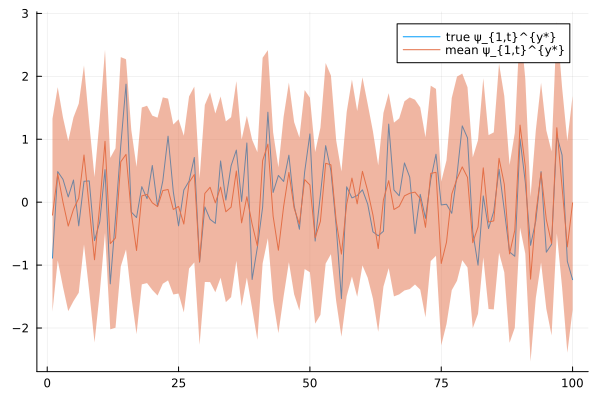

Mean of α_draws: (1, 100, 6)


In [16]:
# Compute the mean over iterations (dimension 1)
α_mean = mean(α_draws, dims=1)
println("Mean of α_draws: ", size(α_mean))

# Compute the 2.5% and 97.5% quantiles 
α_ci = mapslices(x -> quantile(x, [0.025, 0.975]), α_draws, dims=1)



# Plot true states, mean of states, and confidence intervals of states
for i in 1:size(α_mean, 3)
    plot(α[:, i], label="true $(α_elements[i])")
    plot!(α_mean[1, :, i], ribbon=(α_ci[2, :, i] .- α_mean[1, :, i]), label="mean $(α_elements[i])")
    display(plot!())
end


## MLE

In [10]:
# using Optim

# # Define bounds for each parameter:
# # Parameter 1: ρ ∈ [0, 1]
# # Parameter 2: λ_c ∈ [0, 3]
# # Parameters 3-5: variance parameters > 0 (here [1e-6, 3])
# lower_bounds = [0.0, 0.0, 1e-6, 1e-6, 1e-6]
# upper_bounds = [1.0, 3.0, 3.0, 3.0, 3.0]

# # Initial guess for θ (make sure these values lie within the bounds)
# θ_init = [0.5, 1.0, 0.8, 0.8, 0.8]

# # The objective function is as defined before:
# objective(θ) = neg_log_likelihood(θ, y, α0, P0, cycle_order)

# # Optimize using Fminbox to enforce the bounds, wrapping a BFGS optimizer.
# res = optimize(objective, lower_bounds, upper_bounds, θ_init, Fminbox(BFGS()))

# # Extract the estimated parameters
# θ_est = Optim.minimizer(res)

# # Print the results:
# println("\nMLE Results (with bounded optimization):")
# for (i, param_name) in enumerate(θ_elements)
#     println("Estimated $(param_name): $(θ_est[i])   (True value: $(θ_true[i]))")
# end
# println("\nFinal negative log-likelihood: ", Optim.minimum(res))


In [11]:
# # estimate states
# LogL_diff, α_diff, P_diff = diffuse_kalman_filter(obs, θ_est, α0, P0, cycle_order, true, false)

# #plot estimated states and true states
# for i in 1:size(α,2)
#     plot(α[:,i], label="true $(α_elements[i])")
#     plot!(α_diff[:,i], label="smoothed uni $(α_elements[i])")
#     display(plot!())
# end

